Finally have made my own database connecting Ways and nodes via Nominatim (but not without its problems: street name short form problem).

In [1]:
using Pkg
Pkg.activate(".")
using DataFrames
using SQLite
using Plots
using Dates
using Distributions

┌ Info: Recompiling stale cache file /home/mosiman/.julia/compiled/v1.0/Distributions/xILW0.ji for Distributions [31c24e10-a181-5473-b8eb-7969acd0382f]
└ @ Base loading.jl:1184


In [2]:
using LinearAlgebra

In [3]:
using StatPlots

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1186
┌ Info: Recompiling stale cache file /home/mosiman/.julia/compiled/v1.0/KernelDensity/4QyGx.ji for KernelDensity [5ab0869b-81aa-558d-bb23-cbf5423bbe9b]
└ @ Base loading.jl:1184


In [4]:
using StatsBase

In [5]:
using HypothesisTests

┌ Info: Recompiling stale cache file /home/mosiman/.julia/compiled/v1.0/HypothesisTests/MUGEl.ji for HypothesisTests [09f84164-cd44-5f33-b23f-e6b0d136a0d5]
└ @ Base loading.jl:1184


# TODO
- Per-streetsegment statistics
    - How many days out of the year has this been ticketed (frequentist probability)
- What is the distribution of yearly tickets like per ss?
    - Note could be bad if highly segmented ss
- Which streets pass KS test for exponentiality?
- Investigate how to justify exponentiality 
    - https://stats.stackexchange.com/questions/132652/how-to-determine-which-distribution-fits-my-data-best

## Done
- Refactor database with proper datetime column instead of separate date and time columns
- Arpack (needed for Distributions.jl) won't build... try using Julia source binaries.
    - https://discourse.julialang.org/t/arpack-does-not-build-in-1-0-manjaro-linux/14515
- Per-streetsegment time-cluster analysis -- Has exponential distribution?

In [6]:
db = SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

In [7]:
randid = SQLite.query(db, "select * from streetsegments where name like 'Elm Street%'")[5,:].osm_id[1]

4652041

In [8]:
randss = SQLite.query(db, "select * from streetsegments where osm_id= :randid", values = Dict(:randid => randid))

,osm_id,name,slat,nlat,wlng,elng
1,4652041,"Elm Street, Discovery District, Old Toronto, Toronto, Ontario, M5T 1V4, Canada",43.6558,43.6563,-79.392,-79.3891


In [9]:
# get all tickets associated with this street segment
randinfractions = SQLite.query(db, "select * from streetsegmentinfraction where osm_id = :randid", 
                                values = Dict(:randid => randid))

,osm_id,code,fine,loc,datetime
1,4652041,29,30,200 ELM ST,2016-01-02T00:23:00
2,4652041,406,40,200 ELM ST,2016-01-02T08:59:00
3,4652041,210,30,222 ELM ST,2016-01-03T18:10:00
4,4652041,8,60,200 ELM ST,2016-01-05T12:42:00
5,4652041,8,60,222 ELM ST,2016-01-06T13:59:00
6,4652041,14,40,222 ELM ST,2016-01-06T17:35:00
7,4652041,8,60,222 ELM ST,2016-01-07T12:20:00
8,4652041,15,100,200 ELM ST,2016-01-07T15:41:00
9,4652041,8,60,222 ELM ST,2016-01-07T19:18:00
10,4652041,8,60,222 ELM ST,2016-01-08T12:55:00


```
timedf = DateFormat("HHMM")
datedf = DateFormat("yyyymmdd")
Dates.Time("1008", timedf)
times = []
for i in 1:length(randinfractions.time)
        push!(times, Dates.Time(lpad(string(randinfractions.time[i]),4,"0"), timedf))
end
convert(Dates.Minute, (times[2] - times[1]))
datedf = DateFormat("yyyymmddHHMM")
i = 50
datestring = string(randinfractions.date[i]) * lpad(string(randinfractions.time[i]), 4, "0")
DateTime(datestring, datedf)
```

There is a noticable spike in tickets at 12:00 pm and 12:00 am. Between 9:00 pm and 12:00 am is a lull in parking ticket activity. 

```{Julia}
# probably will not need to run again
# Code for converting date/time columns into a datetime column

infractions = SQLite.query(db,"select * from streetsegmentinfraction")

infractions[:datetime] = map((x,y) -> DateTime(string(x) * lpad(string(y), 4, "0"), datedf), 
                                infractions[:date],
                                infractions[:time])

delete!(infractions, :date)
delete!(infractions, :time)

# write to a database
SQLite.execute!(db, "drop table if exists streetsegmentinfraction")
SQLite.load(db, "streetsegmentinfraction", infractions)
```

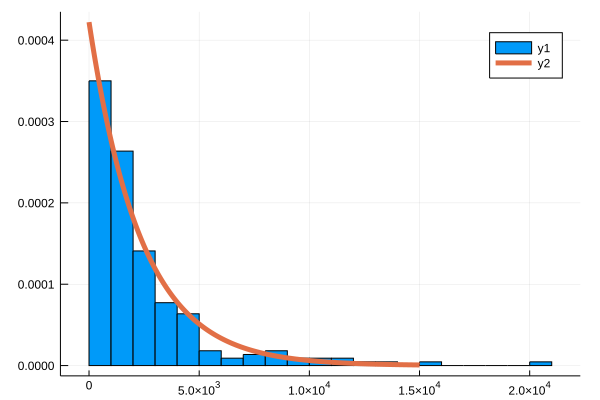

In [32]:
# interarrival times

function get_interarrivals(min_intertime, sorted_vec)
    interarrivals = []
    for i in 1:(length(sorted_vec) - 1)
        if Dates.Minute(sorted_vec[i+1] - sorted_vec[i]) > Dates.Minute(min_intertime)
            push!(interarrivals, Dates.Minute(sorted_vec[i+1] - sorted_vec[i]))
        end
    end
    interarrivals = Dates.value.(interarrivals)
    return interarrivals
end

sorted_dt = sort(randinfractions.datetime)

quarterly_interarrivals = get_interarrivals(15, sorted_dt)
quarterly_expo = fit(Exponential,quarterly_interarrivals)
histogram(quarterly_interarrivals, nbins = 30, normed=true)
plot!(quarterly_expo, 1:1.5e4, lw = 5)

In [11]:
quarterly_expo = fit(Exponential,quarterly_interarrivals)

Exponential{Float64}(θ=920.6818980667838)

In [12]:
fit_mle(Exponential, quarterly_interarrivals)

Exponential{Float64}(θ=920.6818980667838)

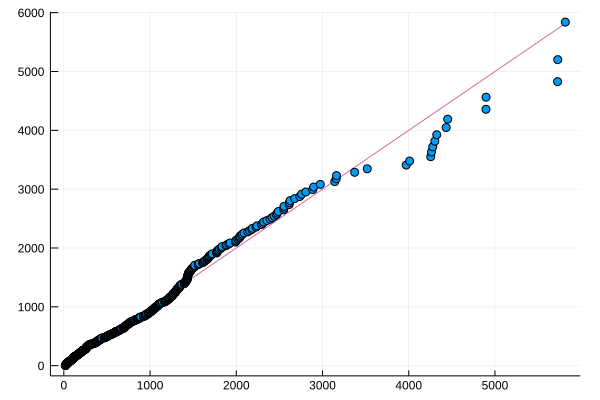

In [13]:
qqplot(quarterly_interarrivals, fit(Exponential, quarterly_interarrivals))

In [40]:
top75 = sort(quarterly_interarrivals)[1:Int(floor(length(quarterly_interarrivals)*0.95))]
qqplot(top75, fit(Exponential, top75))
ApproximateOneSampleKSTest(top75, fit(Exponential, top75))

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112


Approximate one sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.08027116662741181

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1353

Details:
    number of observations:   209
    KS-statistic:             1.1604667940405162


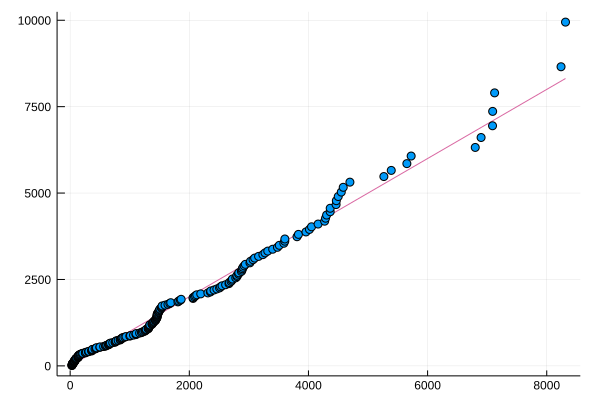

In [41]:
qqplot(top75, fit(Exponential, top75))

The QQ plot suggests that the interarrivals are exponentially distributed.

In [15]:
#kolmogorov-Smirnov test
# tests one sample against a distribution

testresult = ApproximateOneSampleKSTest(quarterly_interarrivals, quarterly_expo)

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112


Approximate one sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.047732139228395754

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1496

Details:
    number of observations:   569
    KS-statistic:             1.1385891263385957


In [16]:
testresult.

LoadError: syntax: incomplete: premature end of input

So here, we've found that for the parameter we fitted above, we fail to reject the null hypothesis of the K-S test, which is to say that the data is sampled from the distribution with a 95% confidence interval. 

Let's also look at the Anderson-Darling test

In [17]:
OneSampleADTest(quarterly_interarrivals, quarterly_expo)

InexactError: InexactError: Int64(Int64, 0.019550726518894074)

We might as well look at the global statistics then

In the case of finding the distribution over all streets, we want to find an estimate $\theta$ for the scale parameter of an exponential distribution that is representative of all streets. 

Let's find the $\theta$ along with a confidence interval by bootstrapping (yikes!)

In [29]:

# sqlite3 order by datetime
#SQLite.query(db, "select * from streetsegmentinfraction order by datetime(datetime)")

numSS = SQLite.query(db, "select count(*) from streetsegments")
minInfractions = 300
β = Int(minInfractions/2)
Β = 1000
interarrival_time = 15

# get all the street segments with more than 300 tickets 
heavyHitters = SQLite.query(db, "select osm_id 
                                 from streetsegmentinfraction 
                                 group by osm_id 
                                 having count(osm_id) >= :mininf",
                                values = Dict(:mininf => minInfractions))
θs = []

for i in 1:Β
    try
        # select random street sample
        #randid = SQLite.query(db, "select osm_id from heavyHitters order by random() limit 1").osm_id[1]
        randid = heavyHitters.osm_id[rand(1:length(heavyHitters.osm_id))]
        randinfractions = SQLite.query(db, "select * from streetsegmentinfraction 
            where osm_id = :randid 
            order by datetime(datetime)",
            values = Dict(:randid => randid))
        d = fit(Exponential, get_interarrivals(interarrival_time, randinfractions.datetime))
        push!(θs, d.θ)
    catch(err)
        println(string(" at: ", randid, " with numinfractions ", length(randinfractions.datetime)))
    end
end
    



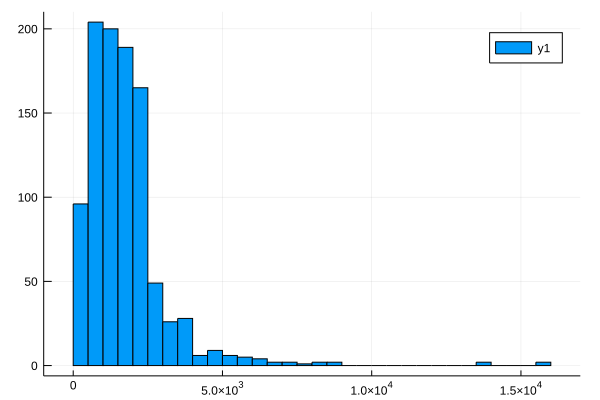

In [42]:
histogram(θs)

In [45]:
map(x -> quantile(θs, x), [0.05, 0.5, 0.95])

3-element Array{Float64,1}:
  391.762084592145 
 1497.097888289531 
 3911.1492537313434

Not all of the things are exponentially distributed... Let's see how many

In [46]:
testresults = []
for i in 1:length(heavyHitters.osm_id)
    try
        # select random street sample
        #randid = SQLite.query(db, "select osm_id from heavyHitters order by random() limit 1").osm_id[1]
        randid = heavyHitters.osm_id[i][1]
        randinfractions = SQLite.query(db, "select * from streetsegmentinfraction 
            where osm_id = :randid 
            order by datetime(datetime)",
            values = Dict(:randid => randid))
        interarrivals = get_interarrivals(interarrival_time, randinfractions.datetime)
        d = fit(Exponential, interarrivals)
        testresult = ApproximateOneSampleKSTest(interarrivals, d)
        push!(testresults, testresult)
    catch(err)
        println(string(" at: ", randid, " with numinfractions ", length(randinfractions.datetime)))
    end
end

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/s

In [50]:
length([x for x in testresults if x.δ > 0.1 && x.δ < 0.2])

845

In [58]:
unique(Dates.Date.(randinfractions.datetime))

122-element Array{Date,1}:
 2016-01-02
 2016-01-04
 2016-01-08
 2016-01-17
 2016-01-27
 2016-02-03
 2016-02-04
 2016-02-05
 2016-02-07
 2016-03-01
 2016-03-19
 2016-03-22
 2016-03-27
 ⋮         
 2016-11-29
 2016-12-02
 2016-12-04
 2016-12-10
 2016-12-13
 2016-12-15
 2016-12-18
 2016-12-19
 2016-12-20
 2016-12-28
 2016-12-29
 2016-12-31

In [60]:
# for each streetsegment, how many days out of the year has a cop actually visited?

streetsegs = SQLite.query(db, "select * from streetsegments")

uniquedays = []

for i in 1:length(streetsegs.osm_id)
    # get all the infractions associated
    id = streetsegs.osm_id[i]
    infs = SQLite.query(db, "select * from streetsegmentinfraction where osm_id = $id")
    push!(uniquedays, unique(Dates.Date.(infs.datetime)))
end
    

In [68]:
histogram(map(length, uniquedays))
ApproximateOneSampleKSTest(map(length, uniquedays), fit(Laplace, map(length,uniquedays)))

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /home/mosiman/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112


Approximate one sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.25470814193163877

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-99

Details:
    number of observations:   19571
    KS-statistic:             35.632749618987134


Global trends per hour

In [73]:
streetsegs = SQLite.query(db, "select * from streetsegmentinfraction")

,osm_id,code,fine,loc,datetime
1,24962816,29,30,49 GLOUCESTER ST,2016-01-01T00:00:00
2,69844659,29,30,45 GLOUCESTER ST,2016-01-01T00:01:00
3,5088685,29,30,274 GEORGE ST,2016-01-01T00:02:00
4,5088685,29,30,270 GEORGE ST,2016-01-01T00:02:00
5,69844659,406,40,45 GLOUCESTER ST,2016-01-01T00:02:00
6,23973402,3,30,621 KING ST W,2016-01-01T00:03:00
7,69844659,29,30,43 GLOUCESTER ST,2016-01-01T00:03:00
8,24962816,29,30,39 GLOUCESTER ST,2016-01-01T00:04:00
9,24962816,406,40,39 GLOUCESTER ST,2016-01-01T00:04:00
10,24962816,29,30,31 GLOUCESTER ST,2016-01-01T00:05:00


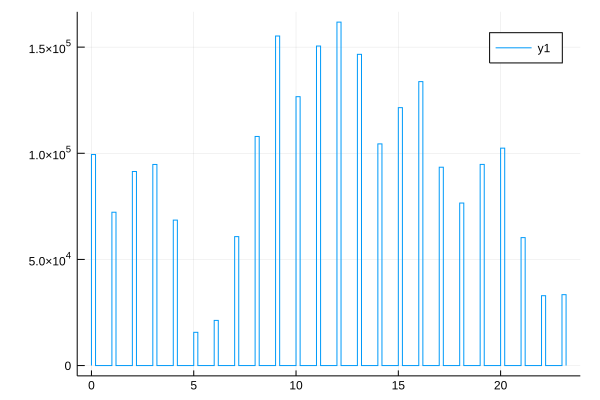

In [76]:
histogram(Dates.hour.(streetsegs.datetime))

In [102]:
# seasonal trends?

# winter is dec 21 to march 20

testdate = streetsegs.datetime[rand(1:1000000)]



2016-04-29T12:30:00

In [117]:
winterinfs = [x for x in streetsegs.datetime if 
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-03-20")) ||
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-12-21"))]
springinfs = [x for x in streetsegs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-03-20")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-06-21"))]
summerinfs = [x for x in streetsegs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-06-21")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-09-22"))]
fallinfs = [x for x in streetsegs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-09-22")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-12-21"))]
                                                


In [123]:
plot(map(x -> histogram(Dates.hour.(x)), [winterinfs, springinfs, summerinfs, fallinfs]))

MethodError: MethodError: no method matching MethodError(::String)
Closest candidates are:
  MethodError(::Any, !Matched::Any) at boot.jl:289
  MethodError(::Any, !Matched::Any, !Matched::UInt64) at boot.jl:286

In [130]:
plot(map(x -> histogram(Dates.hour.(x)), [winterinfs, springinfs, summerinfs, fallinfs]))

MethodError: MethodError: no method matching MethodError(::String)
Closest candidates are:
  MethodError(::Any, !Matched::Any) at boot.jl:289
  MethodError(::Any, !Matched::Any, !Matched::UInt64) at boot.jl:286

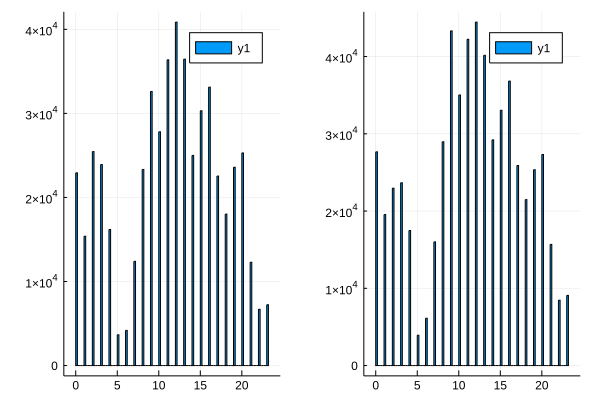

In [135]:
plot(histogram(Dates.hour.(winterinfs)),
    histogram(Dates.hour.(springinfs)))

In [ ]:
bar(Dates.hour.(winterinfs))

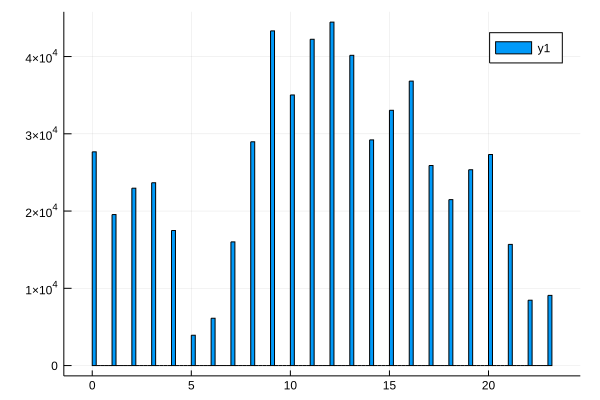

In [27]:
rand(osm_id_morethan300)

ArgumentError: ArgumentError: Sampler for this object is not defined